In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
test = pd.read_csv('SalaryData_Test.csv')
train = pd.read_csv('SalaryData_Train.csv')

In [ ]:
test

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,Private,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,34,Private,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,33,Private,Bachelors,13,Never-married,Prof-specialty,Own-child,White,Male,0,0,40,United-States,<=50K
15056,39,Private,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K
15057,38,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K
15058,44,Private,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K


In [ ]:
train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,Private,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
30157,40,Private,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
30158,58,Private,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
30159,22,Private,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [ ]:
df = test.append(train)

C:\Users\HP\AppData\Local\Temp\ipykernel_11996\1469122130.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = test.append(train)


In [ ]:
df


,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,Private,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,34,Private,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,Private,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
30157,40,Private,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
30158,58,Private,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
30159,22,Private,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [ ]:
from pandas_profiling import ProfileReport

#automatic eda
profile = ProfileReport(df, explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df.corr()

,age,educationno,capitalgain,capitalloss,hoursperweek
age,1.000000,0.037623,0.079682,0.059426,0.101992
educationno,0.037623,1.000000,0.126907,0.081741,0.146206
capitalgain,0.079682,0.126907,1.000000,-0.032095,0.083880
capitalloss,0.059426,0.081741,-0.032095,1.000000,0.054220
hoursperweek,0.101992,0.146206,0.083880,0.054220,1.000000


In [ ]:
from sklearn.preprocessing import LabelEncoder
copy = df.copy()
str_c = ["workclass","education","maritalstatus","occupation","relationship","race","sex","native"]
number = LabelEncoder()
for i in str_c:
    copy[i]=number.fit_transform(copy[i])
    

copy = copy.replace({'Salary':{' >50K': 0, ' <=50K': 1}})

In [ ]:
copy

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,0,0,40,37,1
1,38,2,11,9,2,4,0,4,1,0,0,50,37,1
2,28,1,7,12,2,10,0,4,1,0,0,40,37,0
3,44,2,15,10,2,6,0,2,1,7688,0,40,37,0
4,34,2,0,6,4,7,1,4,1,0,0,30,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,2,7,12,2,12,5,4,0,0,0,38,37,1
30157,40,2,11,9,2,6,0,4,1,0,0,40,37,0
30158,58,2,11,9,6,0,4,4,0,0,0,40,37,1
30159,22,2,11,9,4,0,3,4,1,0,0,20,37,1


In [ ]:
#automatic eda
profile = ProfileReport(copy, explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
copy.corr()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
age,1.000000,0.085890,-0.003497,0.037623,-0.271616,-0.004474,-0.247561,0.023781,0.082040,0.079682,0.059426,0.101992,-0.002879,-0.237035
workclass,0.085890,1.000000,0.017852,0.040778,-0.033217,0.017508,-0.065048,0.049767,0.069633,0.034542,0.008261,0.051366,0.003889,-0.015657
education,-0.003497,0.017852,1.000000,0.347451,-0.041547,-0.033500,-0.013190,0.011446,-0.027531,0.029893,0.016740,0.060890,0.078800,-0.081214
educationno,0.037623,0.040778,0.347451,1.000000,-0.064986,0.089686,-0.088431,0.031655,0.003416,0.126907,0.081741,0.146206,0.094125,-0.332801
maritalstatus,-0.271616,-0.033217,-0.041547,-0.064986,1.000000,0.016399,0.180430,-0.070311,-0.119982,-0.042397,-0.034940,-0.183178,-0.022880,0.192701
occupation,-0.004474,0.017508,-0.033500,0.089686,0.016399,1.000000,-0.051644,-0.000026,0.056626,0.019435,0.015271,0.016160,-0.002628,-0.049788
relationship,-0.247561,-0.065048,-0.013190,-0.088431,0.180430,-0.051644,1.000000,-0.118588,-0.582977,-0.056817,-0.058485,-0.259194,-0.007016,0.253399
race,0.023781,0.049767,0.011446,0.031655,-0.070311,-0.000026,-0.118588,1.000000,0.088949,0.014079,0.020917,0.044739,0.126192,-0.070849
sex,0.082040,0.069633,-0.027531,0.003416,-0.119982,0.056626,-0.582977,0.088949,1.000000,0.047441,0.046639,0.231427,-0.004653,-0.215748
capitalgain,0.079682,0.034542,0.029893,0.126907,-0.042397,0.019435,-0.056817,0.014079,0.047441,1.000000,-0.032095,0.083880,0.007641,-0.221033


In [ ]:
[copy.corr().loc['sex','occupation'],copy.corr().loc['educationno','occupation'],copy.corr().loc['native','race'],copy.corr().loc['educationno','education'],copy.corr().loc['maritalstatus','relationship']]

[0.056626271770893494,
 0.08968575187511965,
 0.12619153009193762,
 0.34745127525838204,
 0.18043009972850138]

In [ ]:
copy = copy.drop('relationship',axis = 1)
copy = copy.drop('education',axis = 1)
copy

,age,workclass,educationno,maritalstatus,occupation,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,7,4,6,2,1,0,0,40,37,1
1,38,2,9,2,4,4,1,0,0,50,37,1
2,28,1,12,2,10,4,1,0,0,40,37,0
3,44,2,10,2,6,2,1,7688,0,40,37,0
4,34,2,6,4,7,4,1,0,0,30,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,2,12,2,12,4,0,0,0,38,37,1
30157,40,2,9,2,6,4,1,0,0,40,37,0
30158,58,2,9,6,0,4,0,0,0,40,37,1
30159,22,2,9,4,0,4,1,0,0,20,37,1


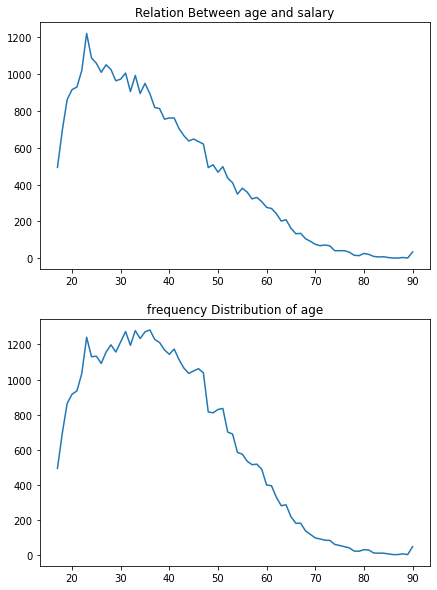

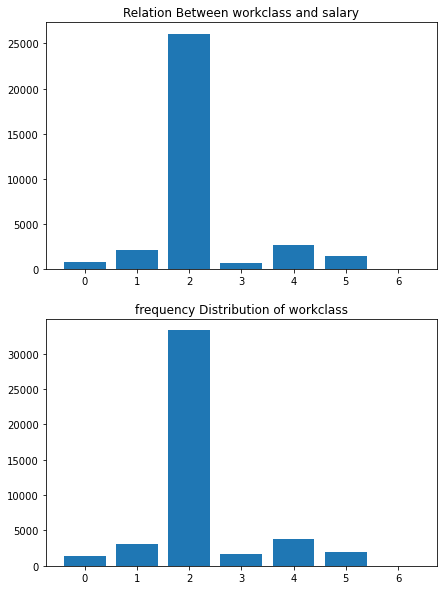

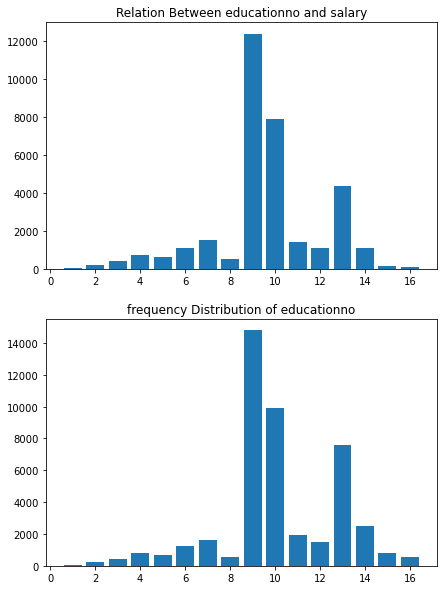

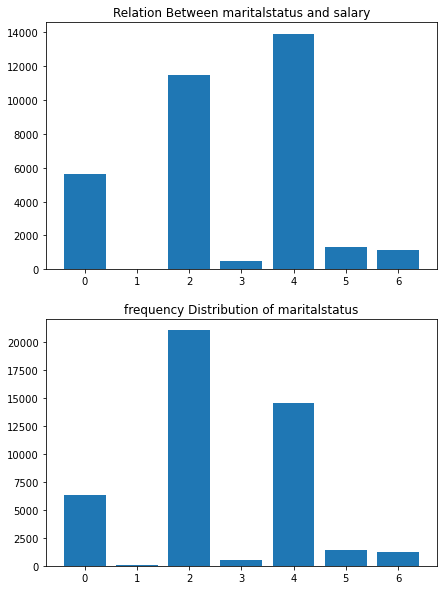

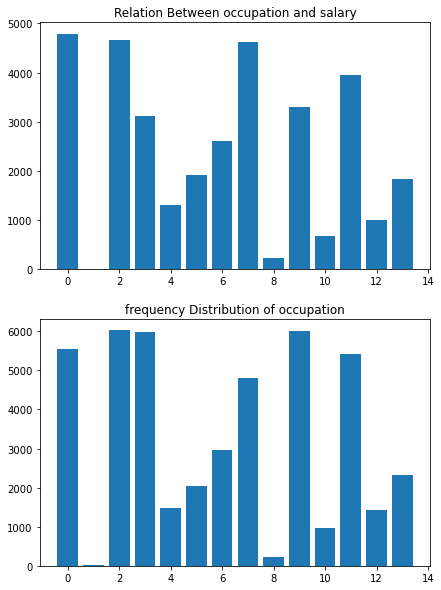

...

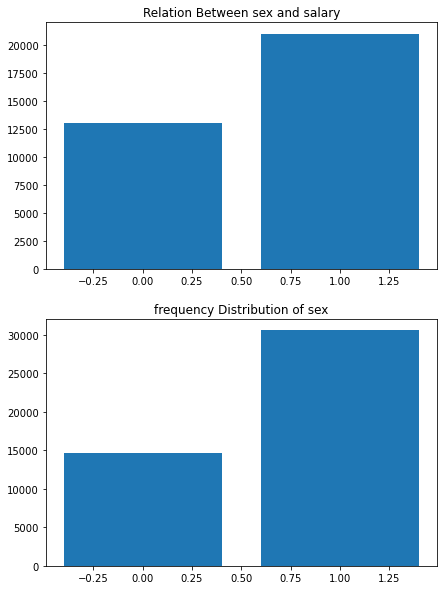

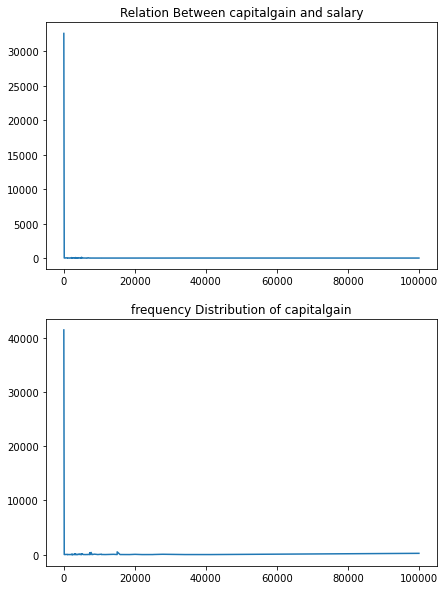

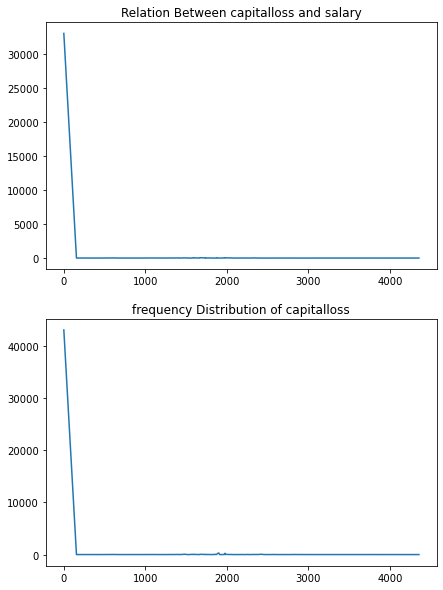

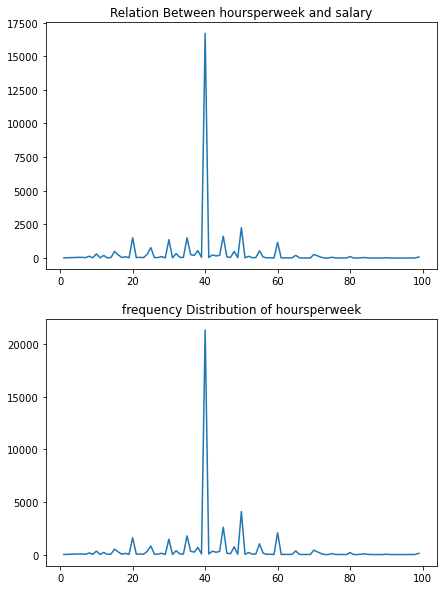

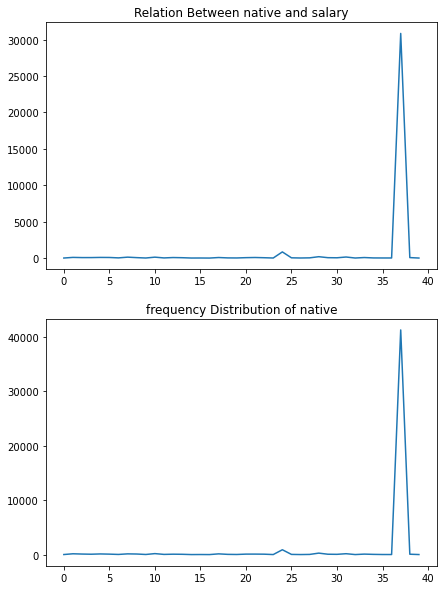

ValueError: Grouper for 'Salary' not 1-dimensional

In [ ]:
col =  copy.columns[:13]
for i in col:
    fn = copy[[i,'Salary']].groupby(i).sum()
    x_bar = fn.index
    y_bar = fn.Salary
    x = np.sort(copy[i].unique())
    n = len(x)
    y = copy[i].value_counts().sort_index()
    head0 = 'Relation Between '+ i +' and salary'
    head1 = 'frequency Distribution of '+i
    if n > 20:
        fig,ax = plt.subplots(2,1,figsize = (7,10))
        ax[0].plot(fn)
        ax[0].set_title(head0)
        ax[1].plot(x,y)
        ax[1].set_title(head1)
        plt.show()
    else:
        fig,ax = plt.subplots(2,1,figsize = (7,10))
        ax[0].bar(x_bar,y_bar)
        ax[0].set_title(head0)
        ax[1].bar(x,y)
        ax[1].set_title(head1)
        plt.show()
        
    
   

# Analysis of Race

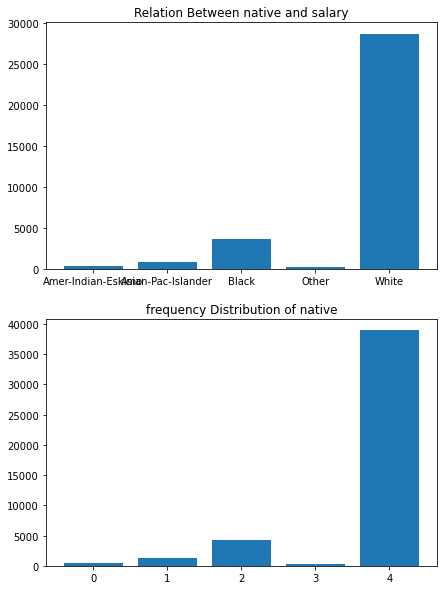

In [ ]:
 fn = copy[['race','Salary']].groupby('race').sum()
x_bar = ['Amer-Indian-Eskimo','Asian-Pac-Islander','Black','Other','White']
y_bar = fn.Salary
x = np.sort(copy['race'].unique())
n = len(x)
y = copy['race'].value_counts().sort_index()
head0 = 'Relation Between '+ i +' and salary'
head1 = 'frequency Distribution of '+i
if n > 20:
    fig,ax = plt.subplots(2,1,figsize = (7,10))
    ax[0].plot(fn)
    ax[0].set_title(head0)
    ax[1].plot(x,y)
    ax[1].set_title(head1)
    plt.show()
else:
    fig,ax = plt.subplots(2,1,figsize = (7,10))
    ax[0].bar(x_bar,y_bar)
    ax[0].set_title(head0)
    ax[1].bar(x,y)
    ax[1].set_title(head1)
    plt.show()
        
    
   

In [ ]:
df['race'].value_counts()

 White                 38902
 Black                  4228
 Asian-Pac-Islander     1303
 Amer-Indian-Eskimo      435
 Other                   353
Name: race, dtype: int64

In [ ]:
copy[copy['Salary']==1]['race'].value_counts()

4    28695
2     3694
1      934
0      382
3      308
Name: race, dtype: int64

In [ ]:
df['race'].unique()

array([' Black', ' White', ' Other', ' Amer-Indian-Eskimo',
       ' Asian-Pac-Islander'], dtype=object)

In [ ]:
copy[copy['race']==4]['Salary'].value_counts().iloc[0]*100/copy[copy['race']==4]['Salary'].value_counts().sum()

73.7622744331911

In [ ]:
copy[copy['race']==2]['Salary'].value_counts().iloc[0]*100/copy[copy['race']==2]['Salary'].value_counts().sum()

87.36991485335857

In [ ]:
copy[copy['Salary']==1]['race'].value_counts().iloc[0]*100/copy[copy['Salary']==1]['race'].value_counts().sum()

84.36480169347014

In [ ]:
(df['race'].value_counts().iloc[0]/df['race'].value_counts().sum())*100

86.02640366201544

86% of people are white

84% of high salary people are white

73% of whites have high salary

87% of black people have high salary

# Analysis of Native

In [ ]:
df['native'].value_counts()*100/df['native'].value_counts().sum()

 United-States                 91.311559
 Mexico                         1.996860
 Philippines                    0.625815
 Germany                        0.426793
 Puerto-Rico                    0.386988
 Canada                         0.360452
 El-Salvador                    0.325070
 India                          0.325070
 Cuba                           0.294111
 England                        0.263152
 China                          0.249884
 Jamaica                        0.227770
 South                          0.223348
 Italy                          0.221136
 Dominican-Republic             0.214502
 Japan                          0.196811
 Guatemala                      0.190177
 Vietnam                        0.183543
 Columbia                       0.181332
 Poland                         0.179120
 Haiti                          0.152584
 Portugal                       0.137104
 Iran                           0.123836
 Taiwan                         0.121625
 Greece         

In [ ]:
copy[copy['native']==37]['Salary'].value_counts()*100/copy[copy['native']==37]['Salary'].value_counts().sum()

1    74.697278
0    25.302722
Name: Salary, dtype: float64

91% are from United States

75% of americans are high salaried

# Analysis Of Age

In [ ]:
np.sort(copy['age'].unique())

array([17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90], dtype=int64)

In [ ]:
x = 50
sum = copy['age'].value_counts().sort_index().sum()
n = 0
for i in range(17,91):
    n = n + copy['age'].value_counts()[i]
    percentage = n*100/sum
    if percentage <= x:
        continue
    else:
        print(x,'%  --  ',i)
        x = x + 5
       

50 %  --   37
55 %  --   39
60 %  --   41
65 %  --   43
70 %  --   45
75 %  --   47
80 %  --   50
85 %  --   53
90 %  --   57
95 %  --   62


   95% of high salary people are below 62 years of age
   

# Analysis of workclass

In [ ]:
copy

,age,workclass,educationno,maritalstatus,occupation,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,7,4,6,2,1,0,0,40,37,1
1,38,2,9,2,4,4,1,0,0,50,37,1
2,28,1,12,2,10,4,1,0,0,40,37,0
3,44,2,10,2,6,2,1,7688,0,40,37,0
4,34,2,6,4,7,4,1,0,0,30,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,2,12,2,12,4,0,0,0,38,37,1
30157,40,2,9,2,6,4,1,0,0,40,37,0
30158,58,2,9,6,0,4,0,0,0,40,37,1
30159,22,2,9,4,0,4,1,0,0,20,37,1


In [ ]:
copy['workclass'].value_counts()

2    33306
4     3796
1     3100
5     1946
3     1646
0     1406
6       21
Name: workclass, dtype: int64

In [ ]:
copy['workclass'].value_counts()*100/copy['workclass'].value_counts().sum()

2    73.651622
4     8.394330
1     6.855222
5     4.303310
3     3.639902
0     3.109175
6     0.046439
Name: workclass, dtype: float64

73% of high salary people are in from Workclass- Private


In [ ]:
copy['educationno'].value_counts().sum()

45221

In [ ]:
14783/45221

0.32690564118440546

In [ ]:
total = copy['educationno'].value_counts().sum()
i = copy['educationno'].value_counts()[9] + copy['educationno'].value_counts()[10] + copy['educationno'].value_counts()[13]
j = 100*i/total
#k = copy[].value_counts().sort_index()
j

71.31863514738727

In [ ]:
x = test.drop('Salary',axis = 1)
y = test['Salary']

In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

In [ ]:
x_train

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native
4324,41,Private,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,15024,0,65,United-States
2179,53,Self-emp-not-inc,Prof-school,15,Married-civ-spouse,Prof-specialty,Husband,Asian-Pac-Islander,Male,0,0,40,India
1906,65,Private,HS-grad,9,Never-married,Adm-clerical,Not-in-family,Black,Female,2993,0,40,United-States
5206,63,Private,HS-grad,9,Divorced,Sales,Not-in-family,White,Female,3674,0,30,United-States
4659,23,Private,HS-grad,9,Never-married,Craft-repair,Own-child,White,Male,0,0,40,United-States
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13123,22,Private,Bachelors,13,Never-married,Adm-clerical,Own-child,White,Female,0,0,40,United-States
3264,28,Self-emp-inc,Bachelors,13,Never-married,Exec-managerial,Own-child,White,Male,0,0,60,United-States
9845,34,Private,Some-college,10,Divorced,Adm-clerical,Unmarried,White,Female,2977,0,65,United-States
10799,29,Private,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,50,United-States


In [ ]:
for a in x_train.columns :
    print(a,'  ', x_train[a].isnull().sum())
    

age    0
workclass    0
education    0
educationno    0
maritalstatus    0
occupation    0
relationship    0
race    0
sex    0
capitalgain    0
capitalloss    0
hoursperweek    0
native    0


In [ ]:
for a in x_test.columns :
    print(a,'  ', x_train[a].isnull().sum())
    

age    0
workclass    0
education    0
educationno    0
maritalstatus    0
occupation    0
relationship    0
race    0
sex    0
capitalgain    0
capitalloss    0
hoursperweek    0
native    0


In [ ]:
!pip install category_encoders

In [ ]:
import category_encoders as ce
encoder = ce.OneHotEncoder(cols=['workclass', 'education', 'maritalstatus', 'occupation', 'relationship', 
                                 'race', 'sex', 'native'])

x_train = encoder.fit_transform(x_train)

x_test = encoder.transform(x_test)

In [ ]:
x_train

,age,workclass_1,workclass_2,workclass_3,workclass_4,workclass_5,workclass_6,workclass_7,education_1,education_2,...,native_31,native_32,native_33,native_34,native_35,native_36,native_37,native_38,native_39,native_40
4324,41,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2179,53,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1906,65,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5206,63,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4659,23,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13123,22,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3264,28,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9845,34,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10799,29,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
x_test

,age,workclass_1,workclass_2,workclass_3,workclass_4,workclass_5,workclass_6,workclass_7,education_1,education_2,...,native_31,native_32,native_33,native_34,native_35,native_36,native_37,native_38,native_39,native_40
4269,37,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7027,61,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8418,41,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
10064,23,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3305,29,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
593,58,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8327,47,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5036,24,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1551,29,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
 col = x_train.columns
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()

x_train = scaler.fit_transform(x_train)

x_test = scaler.transform(x_test)

x_train = pd.DataFrame(x_train, columns= col)
x_test = pd.DataFrame(x_test, columns=col)

In [ ]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()

gnb.fit(X_train, y_train)

GaussianNB()

In [ ]:
encode = ce.OneHotEncoder(cols=['workclass', 'education', 'maritalstatus', 'occupation', 'relationship', 
                                 'race', 'sex', 'native'])
df_new = encode.fit_transform(df)
df_new

,age,workclass_1,workclass_2,workclass_3,workclass_4,workclass_5,workclass_6,workclass_7,education_1,education_2,...,native_32,native_33,native_34,native_35,native_36,native_37,native_38,native_39,native_40,Salary
0,25,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,<=50K
1,38,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,<=50K
2,28,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,>50K
3,44,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,>50K
4,34,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,<=50K
30157,40,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,>50K
30158,58,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,<=50K
30159,22,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,<=50K


In [ ]:
y_pred = gnb.predict(df_new.drop('Salary',axis = 1))

y_pred


array([' >50K', ' <=50K', ' <=50K', ..., ' <=50K', ' <=50K', ' >50K'],
      dtype='<U6')

In [ ]:
df['Pred_Sal'] = y_pred

In [ ]:
df

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary,Pred_Sal
0,25,Private,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K,>50K
1,38,Private,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K,<=50K
2,28,Local-gov,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K,<=50K
3,44,Private,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K,>50K
4,34,Private,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,Private,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K,<=50K
30157,40,Private,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K,<=50K
30158,58,Private,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K,<=50K
30159,22,Private,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K,<=50K


In [ ]:
df.iloc[0,14]

' >50K'

In [ ]:
n = 0
for a in range(0,45221):
    if df.iloc[a,13] == df.iloc[a,14]:
        n = n + 1
    else:
        n= n + 0
eficay = (n/45221)*100
print('efficiency is ',eficay,'%')
        
    




efficiency is  75.70597731142611 %
